# Assignment 2: Vision Transformers & Vision-Language Models

The first goal of this assignment is to understand how the transformer architecture introduced in the first assignment can be extended from text to images, resulting in a Vision Transformer (ViT). Then, you will learn more about joint modelling of text and image data, i.e. vision-language models (VLMs). Using Contrastive Language-Image Pretraining (CLIP) as a specific case study of VLMs, you will investigate how these models bridge modalities to enable tasks such as matching images to text 
prompts. 

Since VLMs are computationally very demanding to train (even for small datasets), you will work with already pretrained vision–language models based on the OpenCLIP architecture. You will evaluate their ability to associate histopathology images with textual concepts through the task of magnification prediction, which is defined as a binary classification distinguishing between low-power and high-power magnification in microscopy images (Figures 1 and 2). While this task holds limited clinical value (as pathologists do not need assistance identifying magnification), it is relatively simple and sufficient to demonstrate the ability of pre-trained models to encode and distinguish domain-specific visual features in their latent space. Although these categories are visually distinct, models pretrained on non-histopathology image-text pairs may not reliably associate these visual patterns with such domain-specific textual labels.

To address cases when the ViT encodes meaningful features of domain-specific images but does not have the concepts explicitly labeled, we will first introduce a linear probing technique. Linear probing involves training a lightweight classifier on top of **frozen** image embeddings to test whether the relevant information is already present in the representation (latent) space of the vision encoder. This technique allows us to use the learned image representation for classification tasks without retraining the vision transformer (which would be computationally expensive).

Finally, we will compare the linear probing results with the zero-shot classification performance of two vision transformers with the same architecture but pretrained on different datasets: one on general natural images and one on medical images. Zero-shot classification involves using the pretrained alignment between text and images to classify data into categories that were not explicitly seen during the model's training. 

As in the previous assignment, we will use the [Open-MELON dataset](https://huggingface.co/datasets/MartiHan/Open-MELON-VL-2.5K) for both of these tasks. 

![Low-power view example](../assets/low_power_example.png)

*Figure 1: Example of low-power (low-magnification) view from Open-MELON dataset*

![High-power view example](../assets/high_power_example.png)

*Figure 2: Example of high-power (high-magnification) view from Open-MELON dataset*

## Applying a Vision-Language Model

### Install Required Packages

This notebook uses:
- `datasets` (Hugging Face) for dataset loading
- `transformers` for pre-trained models
- `open_clip_torch` for the OpenCLIP model
- `scikit-learn` for metrics and PCA
- `pillow` for image manipulation
- `matplotlib` for result visualization
- `tqdm` for displaying progress bars

Let's install the required packages:

In [ ]:
!pip install datasets transformers open_clip_torch scikit-learn pillow matplotlib tqdm ipywidgets

### Import the Libraries

The following Python modules will be used for ViT models evaluation and visualization of the results.

In [27]:
import shutil
from datetime import datetime

# Use absolute path so it works regardless of kernel cwd
_NB_PATH = os.path.join(os.path.dirname(os.path.abspath('__file__')), 'assignment_2_clean.ipynb')
# Fallback: search common locations
for _p in [_NB_PATH,
           os.path.join(os.getcwd(), 'assignment_2_clean.ipynb'),
           os.path.join(os.getcwd(), 'lab2', 'assignment_2_clean.ipynb'),
           '/Users/d/Documents/team5-medical-ai/lab2/assignment_2_clean.ipynb']:
    if os.path.exists(_p):
        _NB_PATH = _p
        break

SNAPSHOTS_DIR = os.path.join(os.path.dirname(_NB_PATH), 'snapshots')
os.makedirs(SNAPSHOTS_DIR, exist_ok=True)

def save_snapshot(tag=''):
    ts = datetime.now().strftime('%Y%m%d_%H%M%S')
    suffix = f'_{tag}' if tag else ''
    name = f'{ts}{suffix}.ipynb'
    shutil.copy(_NB_PATH, os.path.join(SNAPSHOTS_DIR, name))
    print(f'Snapshot saved: {name}')

save_snapshot('start')


Snapshot saved: 20260313_232056_start.ipynb


In [ ]:
import os
import random
import numpy as np
import torch
import open_clip
from torch.utils.data import Dataset, DataLoader
from datasets import load_dataset
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, roc_auc_score

### Environment Configuration
Evaluation of the ViTs may be very slow on CPU-only laptops when applying to a full dataset. Code block below automatically detects whether a GPU is present and applies configuration accordingly.

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

BATCH_SIZE = 32

### Load the Dataset


In [ ]:
ds_train, ds_test = load_dataset("MartiHan/Open-MELON-VL-2.5K", split=["train", "test"])
print(ds_train, ds_test)

### Load the OpenCLIP Models

We now download two pretrained OpenCLIP models from HuggingFace Hub, both based on [ViT-B-16](https://docs.pytorch.org/vision/main/models/generated/torchvision.models.vit_b_16.html) architecture.

For a general model, a standard checkpoint `laion2b_s34b_b88k` is selected with default tokenizer. For a model trained on medical image-text pairs we will use [OpenCLIP-BiomedCLIP-Finetuned](https://huggingface.co/mgbam/OpenCLIP-BiomedCLIP-Finetuned).

In [ ]:

# ViT pretrained on general dataset
model_general, preprocess_train, preprocess_val = open_clip.create_model_and_transforms("ViT-B-16", pretrained="laion2b_s34b_b88k", device=device)
tokenizer_general = open_clip.get_tokenizer("ViT-B-16")

# ViT pretrained on medical dataset
model_medical, preprocess_train, preprocess_val = open_clip.create_model_and_transforms("hf-hub:mgbam/OpenCLIP-BiomedCLIP-Finetuned", pretrained=None, device=device)
tokenizer_medical = open_clip.get_tokenizer("hf-hub:mgbam/OpenCLIP-BiomedCLIP-Finetuned")


### Dataset Wrapper

As mentioned, we will utilize the Open-MELON dataset to perform an illustrative classification task predicting image magnification (low vs. high power). The code below is a PyTorch data pipeline that filters the Open-MELON dataset to keep only images with valid magnification metadata and categorizes them into "low-power" or "high-power". This establishes the ground truth for our task. It also applies necessary image preprocessing transformations and initializes DataLoader instances to efficiently batch and stack these tensors alongside their text labels for use in models.

In [ ]:
class HFDatasetImages(Dataset):
    def __init__(self, hf_ds, preprocess):
        self.ds = hf_ds
        self.preprocess = preprocess

        # keep only samples with known magnification
        self.valid_indices = []
        for i in range(len(self.ds)):
            if self.ds[i].get("magnification", None) is not None:
                self.valid_indices.append(i)

        print(f"Kept {len(self.valid_indices)} / {len(self.ds)} samples")

    def __len__(self):
        return len(self.valid_indices)

    def __getitem__(self, idx):
        ex = self.ds[self.valid_indices[idx]]

        img = ex["image"].convert("RGB")
        try:
            mag_num = int(ex["magnification"])
            if mag_num <= 80:
                mag_label = "low-power"
            else:
                mag_label = "high-power"
        except:
            mag_label = ex["magnification"]

        x_img = self.preprocess(img)
        return x_img, mag_label

def collate_fn(batch):
    imgs, labels = zip(*batch)
    imgs = torch.stack(imgs, dim=0)
    return imgs, list(labels)

loader_train = DataLoader(
    HFDatasetImages(ds_train, preprocess_val),
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    collate_fn=collate_fn,
)

loader_test = DataLoader(
    HFDatasetImages(ds_test, preprocess_val),
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    collate_fn=collate_fn,
)


### Generate Image Embeddings


The two loaded OpenCLIP models will be used to generate embeddings for both training and testing set. In Colab, the evaluation might take up to 30 minutes on the CPU-only session, and approximately 1 minute on GPU.

In [ ]:
@torch.no_grad()
def compute_image_embeddings(dataloader, model, device):
    img_embs = []
    labels = []

    model.eval()

    for imgs, labs in dataloader:
        imgs = imgs.to(device, non_blocking=True)

        feats = model.encode_image(imgs)
        feats = feats / feats.norm(dim=-1, keepdim=True)

        img_embs.append(feats.cpu().numpy())
        labels.extend(labs)

    return np.vstack(img_embs), labels

# --- Disk caching wrapper ---
CACHE_DIR = os.path.join(os.getcwd(), "embedding_cache")
os.makedirs(CACHE_DIR, exist_ok=True)

def load_or_compute(name, loader, model, device):
    emb_path = os.path.join(CACHE_DIR, f"{name}_emb.npy")
    lab_path = os.path.join(CACHE_DIR, f"{name}_lab.npy")
    if os.path.exists(emb_path) and os.path.exists(lab_path):
        print(f"Loading cached {name}")
        return np.load(emb_path), np.load(lab_path, allow_pickle=True).tolist()
    print(f"Computing {name} (will be cached)...")
    emb, lab = compute_image_embeddings(loader, model, device)
    np.save(emb_path, emb)
    np.save(lab_path, np.array(lab, dtype=object))
    return emb, lab

#### Medical OpenCLIP model ####
img_emb_med_train, labels_train = load_or_compute("med_train", loader_train, model_medical, device)
print("Train embeddings:", img_emb_med_train.shape)

img_emb_med_test, labels_test = load_or_compute("med_test", loader_test, model_medical, device)
print("Test embeddings:", img_emb_med_test.shape)

#### General OpenCLIP model ####
img_emb_gen_train, labels_train = load_or_compute("gen_train", loader_train, model_general, device)
print("Train embeddings:", img_emb_gen_train.shape)

img_emb_gen_test, labels_test = load_or_compute("gen_test", loader_test, model_general, device)
print("Test embeddings:", img_emb_gen_test.shape)


### Visualizing the Embeddings

The produced image embeddings are high-dimensional vectors (512 dimensions) that capture visual information learned by the vision transformer. To better understand how these embeddings are organized, we use Principal Component Analysis (PCA) to project them into a two-dimensional space that can be visualized.

PCA is a linear dimensionality reduction technique that finds directions (principal components) along which the data varies the most. When we project the embeddings onto the first two principal components, we preserve as much of the original variance as possible while reducing the dimensionality. Importantly, PCA does not use class labels; it reflects only the structure present in the embeddings themselves.

For visualization purposes, we concatenate the training and testing sets and apply PCA to the combined embeddings. Each point in the resulting plot represents one image, positioned according to its embedding in the reduced space. Points that are close together correspond to images with similar embeddings, while points that are far apart indicate greater dissimilarity as perceived by the model.

It is important to note that PCA is only a visualization tool: separation in the plot does not directly imply classification performance. However, such plots are valuable for building intuition about what information the model has learned and how different visual factors are reflected in the embedding space.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# --- concatenate train + test ---
img_emb_med = np.concatenate([img_emb_med_train, img_emb_med_test], axis=0)
labels  = np.concatenate([labels_train, labels_test], axis=0)

img_emb_gen = np.concatenate([img_emb_gen_train, img_emb_gen_test], axis=0)

y_labels = np.array([1 if c == "high-power" else 0 for c in labels])

# --- PCA projections ---
pca = PCA(n_components=2, random_state=42)

X_med = pca.fit_transform(img_emb_med)
X_gen = pca.fit_transform(img_emb_gen)

# --- plotting ---
fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=False)

# Medical ViT
axes[0].scatter(X_med[y_labels == 0, 0], X_med[y_labels == 0, 1],
                s=12, alpha=0.7, label="low-power")
axes[0].scatter(X_med[y_labels == 1, 0], X_med[y_labels == 1, 1],
                s=12, alpha=0.7, label="high-power")
axes[0].set_title("Medical ViT embeddings")
axes[0].legend()
axes[0].set_xlabel("PC1")
axes[0].set_ylabel("PC2")

# General ViT
axes[1].scatter(X_gen[y_labels == 0, 0], X_gen[y_labels == 0, 1],
                s=12, alpha=0.7, label="low-power")
axes[1].scatter(X_gen[y_labels == 1, 0], X_gen[y_labels == 1, 1],
                s=12, alpha=0.7, label="high-power")
axes[1].set_title("General ViT embeddings")
axes[1].legend()
axes[1].set_xlabel("PC1")

plt.tight_layout()
plt.show()


When examining the results, you may observe that embeddings from the medical vision transformer show somewhat clearer separation between low-power and high-power images compared to the general vision transformer. This suggests that magnification-related information is more explicitly encoded in the representations of the medical model.

### Linear Probing
To better understand whether magnification information is present in the image embeddings themselves (independently of language alignment) we now apply linear probing. In linear probing, we freeze the image embeddings and train a logistic regression classifier on top of them using labeled data. This classifier learns the optimal linear weights directly from the data, rather than relying on fixed weights derived from text prompts.

In [ ]:
def make_binary_labels(labels):
    """
    Convert string labels to binary:
    low-power -> 0
    high-power -> 1
    """
    return np.array(
        [1 if c == "high-power" else 0 for c in labels],
        dtype=np.int32
    )

def linear_probe(
    X_train, y_train,
    X_test,  y_test,
    max_iter=2000,
    class_weight="balanced"
):
    # Standardize features
    scaler = StandardScaler()
    X_train_std = scaler.fit_transform(X_train)
    X_test_std  = scaler.transform(X_test)

    # Train logistic regression
    clf = LogisticRegression(
        max_iter=max_iter,
        class_weight=class_weight
    )
    clf.fit(X_train_std, y_train)

    # Probabilities for positive class
    y_prob = clf.predict_proba(X_test_std)[:, 1]

    # ROC + AUC
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    auc = roc_auc_score(y_test, y_prob)

    return {
        "model": clf,
        "scaler": scaler,
        "y_prob": y_prob,
        "fpr": fpr,
        "tpr": tpr,
        "auc": auc,
    }


y_train = make_binary_labels(labels_train)
y_test  = make_binary_labels(labels_test)


print("Class balance:", np.bincount(y_train))

print("#### Logistic Regression on Medical ViT ###")

lr_med = linear_probe(
    X_train=img_emb_med_train,
    y_train=y_train,
    X_test=img_emb_med_test,
    y_test=y_test
)

print(f"-AUC score: {lr_med["auc"]:.2f}/1.00")

print("#### Logistic Regression on General ViT ###")

lr_gen = linear_probe(
    X_train=img_emb_gen_train,
    y_train=y_train,
    X_test=img_emb_gen_test,
    y_test=y_test
)

print(f"-AUC score: {lr_gen["auc"]:.2f}/1.00")


### Zero-shot Model Evaluation
So far, we have only used the image encoder, effectively treating OpenCLIP as a standard vision backbone model. We have not yet made use of the text encoder or the aligned latent space that characterizes Vision-Language Models.

One way we can do that is by exploiting the contrastive nature of the pretraining. Because the model was optimized to maximize the similarity between matching image-text pairs, we can classify images by directly comparing their embeddings to the embeddings of potential text labels.

In the following code, we define two simple text prompts—"low-power" and "high-power"—encode them using the text encoder, and compute cosine similarities between the image and text embeddings. The resulting similarity scores are converted into class probabilities using a softmax function, allowing us to evaluate the so called "zero-shot" classification performance without training a specific classifier.

Unlike linear probing, zero-shot evaluation does not learn any task-specific classifier from labeled data. Instead, it relies entirely on the alignment between image and text embeddings learned during contrastive pretraining.

In [ ]:
PROMPTS = [
    "low-power",
    "high-power",
]

@torch.no_grad()
def zeroshot_clip_scores(
    model,
    tokenizer,
    img_emb_np,
    prompts,
    device
):
    model.eval()

    # --- text embeddings ---
    tokens = tokenizer(prompts).to(device)
    txt_emb = model.encode_text(tokens)
    txt_emb = txt_emb / txt_emb.norm(dim=-1, keepdim=True)

    # --- image embeddings ---
    img_emb = torch.from_numpy(img_emb_np).to(device)
    img_emb = img_emb / img_emb.norm(dim=-1, keepdim=True)

    # --- similarity & probability ---
    logits = img_emb @ txt_emb.T
    probs = torch.softmax(logits, dim=1)

    # probability of "high magnification"
    return probs[:, 1].detach().cpu().numpy()


y = np.array(
    [1 if c == "high-power" else 0 for c in labels_test],
    dtype=np.int32
)


### Receiver Operating Characteristic

To compare different classification approaches in a threshold-independent way, we use Receiver Operating Characteristic (ROC) curves. An ROC curve plots the true positive rate (sensitivity) against the false positive rate (1 − specificity) as the decision threshold is varied. Instead of committing to a single cutoff (such as probability ≥ 0.5), the ROC curve summarizes model behavior across all possible thresholds.

The area under the ROC curve (ROC-AUC) provides a single scalar measure of performance. An AUC of 0.5 corresponds to random guessing, while an AUC of 1.0 indicates perfect separation. Importantly, ROC-AUC measures how well a model ranks positive samples above negative ones, which makes it particularly suitable for comparing models with different calibration or decision rules.

In [ ]:
# --- General ViT ---
p_high_gen = zeroshot_clip_scores(
    model_general,
    tokenizer_general,
    img_emb_gen_test,
    PROMPTS,
    device
)

auc_gen = roc_auc_score(y, p_high_gen)
fpr_gen, tpr_gen, _ = roc_curve(y, p_high_gen)

print(f"General ViT zero-shot ROC-AUC: {auc_gen:.3f}")
print(f"General ViT logistic regression ROC-AUC: {lr_gen['auc']:.3f}")

# --- Medical ViT ---
p_high_med = zeroshot_clip_scores(
    model_medical,
    tokenizer_medical,
    img_emb_med_test,
    PROMPTS,
    device
)

auc_med = roc_auc_score(y, p_high_med)
fpr_med, tpr_med, _ = roc_curve(y, p_high_med)


print(f"Medical ViT zero-shot ROC-AUC: {auc_med:.3f}")
print(f"Medical ViT logistic regression ROC-AUC: {lr_med['auc']:.3f}")

plt.figure(figsize=(6.8, 6.8))

# Logistic regression probes
plt.plot(lr_med["fpr"], lr_med["tpr"], lw=2,
         label=f"LR probe — Medical ViT (AUC={lr_med['auc']:.3f})")

# Zero-shot CLIP
plt.plot(fpr_med, tpr_med, lw=2,
         label=f"Zero-shot CLIP — Medical ViT (AUC={auc_med:.3f})")

plt.plot(lr_gen["fpr"], lr_gen["tpr"], lw=2,
         label=f"LR probe — General ViT (AUC={lr_gen['auc']:.3f})")

plt.plot(fpr_gen, tpr_gen, lw=2,
         label=f"Zero-shot CLIP — General ViT (AUC={auc_gen:.3f})")

# Chance line
plt.plot([0, 1], [0, 1], "k--", label="Chance")

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Magnification classification — ROC comparison")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


---
## Exercises (deliverables)

### Exercise 1
Replace the lightweight logistic regression classifier in the linear probing example with a custom deep neural network architecture. Justify the model and training hyperparameters and comment on the improvements in the classification performance compared to the linear probing.


DNN Medical AUC: 0.719  |  LR Medical AUC: 0.741
DNN General AUC: 0.696  |  LR General AUC: 0.683


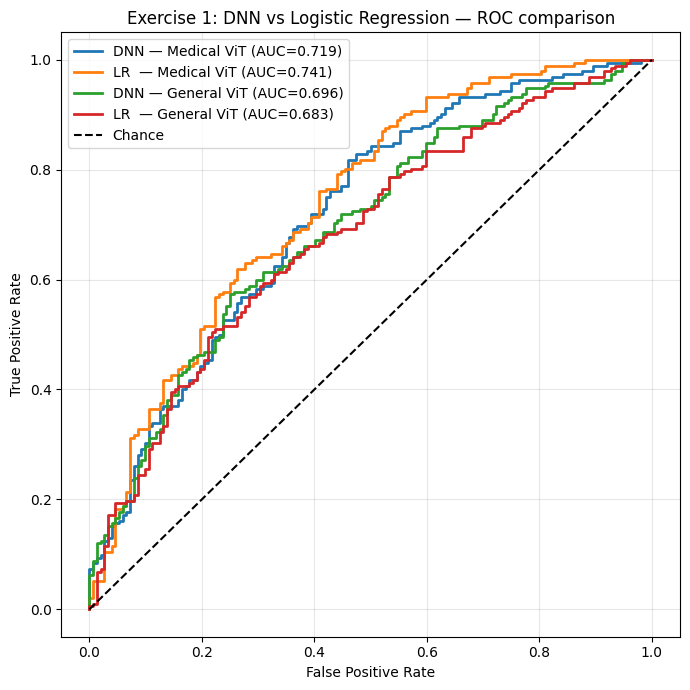

Saved images/ex1/roc_comparison.png


In [ ]:
# Exercise 1
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset

class MLPClassifier(nn.Module):
    def __init__(self, dim=512):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(dim, 256), nn.BatchNorm1d(256), nn.ReLU(), nn.Dropout(0.3),
            nn.Linear(256, 64),  nn.BatchNorm1d(64),  nn.ReLU(), nn.Dropout(0.3),
            nn.Linear(64, 1),
        )
    def forward(self, x):
        return self.net(x).squeeze(-1)

def _train_and_eval(X_tr, y_tr, X_te, y_te, epochs=80, lr=1e-3, bs=32):
    scaler = StandardScaler()
    X_tr_s = torch.FloatTensor(scaler.fit_transform(X_tr))
    X_te_s = torch.FloatTensor(scaler.transform(X_te))
    y_tr_t = torch.FloatTensor(y_tr)
    loader = DataLoader(TensorDataset(X_tr_s, y_tr_t), batch_size=bs, shuffle=True)
    model = MLPClassifier(X_tr.shape[1])
    opt = optim.Adam(model.parameters(), lr=lr)
    loss_fn = nn.BCEWithLogitsLoss()
    model.train()
    for _ in range(epochs):
        for xb, yb in loader:
            opt.zero_grad()
            loss_fn(model(xb), yb).backward()
            opt.step()
    model.eval()
    with torch.no_grad():
        y_prob = torch.sigmoid(model(X_te_s)).numpy()
    fpr, tpr, _ = roc_curve(y_te, y_prob)
    auc = roc_auc_score(y_te, y_prob)
    return {'fpr': fpr, 'tpr': tpr, 'auc': auc, 'y_prob': y_prob}

def reproduce_ex1():
    dnn_med = _train_and_eval(img_emb_med_train, y_train, img_emb_med_test, y_test)
    dnn_gen = _train_and_eval(img_emb_gen_train, y_train, img_emb_gen_test, y_test)
    print(f'DNN Medical AUC: {dnn_med["auc"]:.3f}  |  LR Medical AUC: {lr_med["auc"]:.3f}')
    print(f'DNN General AUC: {dnn_gen["auc"]:.3f}  |  LR General AUC: {lr_gen["auc"]:.3f}')
    plt.figure(figsize=(7, 7))
    plt.plot(dnn_med['fpr'], dnn_med['tpr'], lw=2, label=f'DNN — Medical ViT (AUC={dnn_med["auc"]:.3f})')
    plt.plot(lr_med['fpr'],  lr_med['tpr'],  lw=2, label=f'LR  — Medical ViT (AUC={lr_med["auc"]:.3f})')
    plt.plot(dnn_gen['fpr'], dnn_gen['tpr'], lw=2, label=f'DNN — General ViT (AUC={dnn_gen["auc"]:.3f})')
    plt.plot(lr_gen['fpr'],  lr_gen['tpr'],  lw=2, label=f'LR  — General ViT (AUC={lr_gen["auc"]:.3f})')
    plt.plot([0,1],[0,1],'k--', label='Chance')
    plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate')
    plt.title('Exercise 1: DNN vs Logistic Regression — ROC comparison')
    plt.legend(); plt.grid(alpha=0.3); plt.tight_layout()
    os.makedirs('images/ex1', exist_ok=True)
    plt.savefig('images/ex1/roc_comparison.png', dpi=150)
    plt.show()
    print('Saved images/ex1/roc_comparison.png')

reproduce_ex1()


**Exercise 1 Answer:**

We replaced logistic regression with a 3-layer MLP (512→256→64→1) using BatchNorm, ReLU, and dropout (0.3). We chose this over a deeper 4-layer network (512→128→64→32→1) without regularization for several reasons. First, BatchNorm stabilizes training by normalizing intermediate activations, which reduces sensitivity to learning rate choice and speeds up convergence. Second, dropout (0.3) acts as a regularizer that prevents co-adaptation of neurons, which is important given our relatively small training set (~1500 samples) — without it, a deeper network risks memorizing training data rather than learning generalizable patterns. Third, we use BCEWithLogitsLoss instead of Sigmoid + BCELoss because it combines the two operations in a numerically stable way, avoiding the log of nearly zero gradient issues that can occur with separate sigmoid (https://docs.pytorch.org/docs/stable/generated/torch.nn.BCEWithLogitsLoss.html) Finally, the wider first hidden layer (256 vs 128 neurons) gives the network more capacity to capture the structure of the 512-dimensional embeddings before compressing, rather than immediately bottlenecking the representation.

For hyperparameters: Adam optimizer (lr=0.001) is a robust adaptive optimizer that adjusts per-parameter learning rates, making it a safe default. Batch size 32 balances gradient stability with computational efficiency. We train for 80 epochs, which is enough for convergence on this dataset size without overfitting thanks to the dropout layers.

The results show that the DNN does not uniformly outperform logistic regression. On the medical ViT embeddings, LR (0.741) slightly beats the DNN (0.719), suggesting that the medical model already produces linearly separable features for this task, and the extra model capacity provides no benefit. On the general ViT embeddings, the DNN (0.696) edges out LR (0.683), indicating some non-linear structure in those embeddings that a linear classifier cannot capture. This makes sense: the medical ViT was pretrained on domain-relevant data and likely produces cleaner, more structured representations for histopathology, while the general ViT's features benefit from a non-linear decision boundary.


### Exercise 2
Inspect the content of [Open-MELON](https://huggingface.co/datasets/MartiHan/Open-MELON-VL-2.5K) dataset. Propose 3 possible classification tasks other than predicting the magnification level. Implement the classification using the zero-shot method and **qualitatively** evaluate the performance (show images inline and judge by eye).


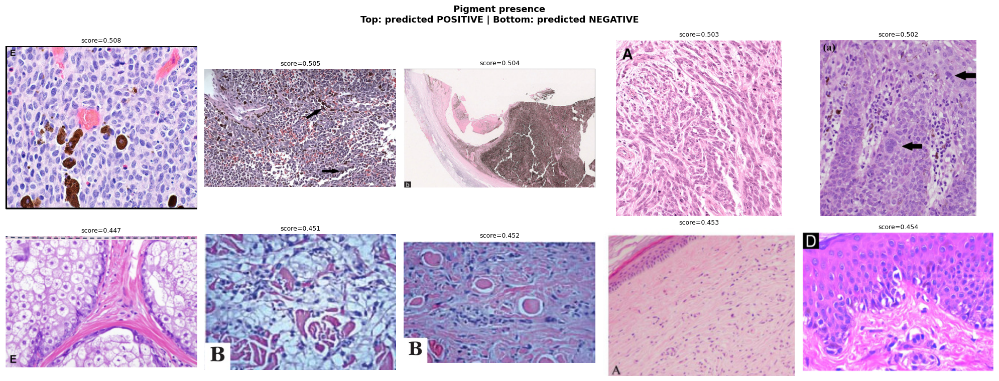

Saved images/ex2/pigment_presence.png


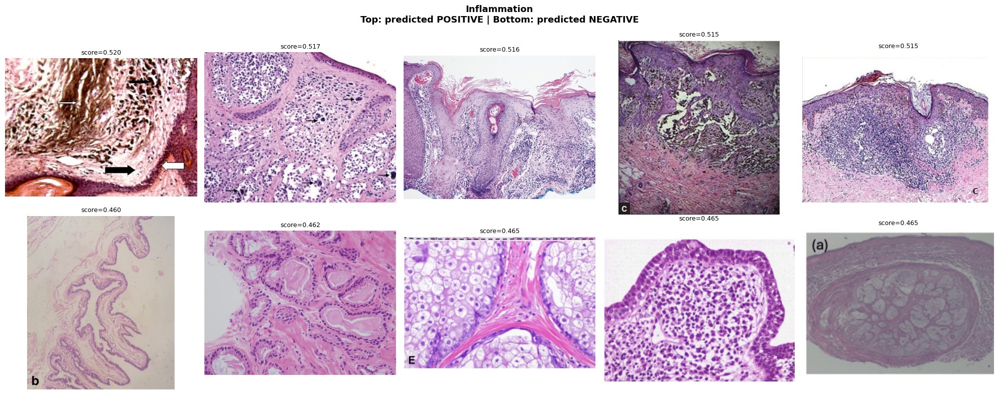

Saved images/ex2/inflammation.png


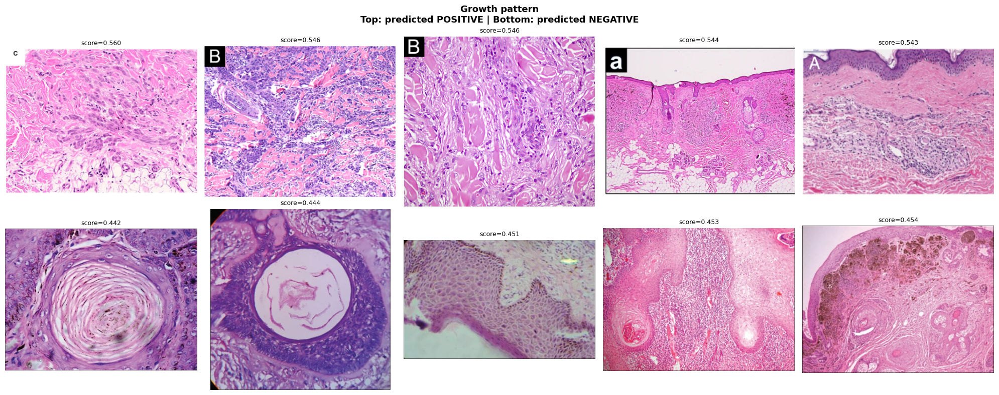

Saved images/ex2/growth_pattern.png


In [ ]:
# Exercise 2:

TASKS = {
    'Pigment presence': [
        'a histopathology image without pigment',
        'a histopathology image with brown melanin pigment',
    ],
    'Inflammation': [
        'a histopathology image without inflammation',
        'a histopathology image with inflammatory cell infiltrate',
    ],
    'Growth pattern': [
        'a well-circumscribed lesion with a pushing border',
        'an infiltrative lesion with irregular invasive border',
    ],
}

def reproduce_ex2():
    # Use medical model for all tasks
    all_emb = np.concatenate([img_emb_med_train, img_emb_med_test], axis=0)

    # Build image references: (split_ds, original_idx) for each embedding row
    refs = []
    for ii in range(len(ds_train)):
        if ds_train[ii].get('magnification', None) is not None:
            refs.append(('train', ii))
    for ii in range(len(ds_test)):
        if ds_test[ii].get('magnification', None) is not None:
            refs.append(('test', ii))

    for task_name, prompts in TASKS.items():
        scores = zeroshot_clip_scores(
            model_medical, tokenizer_medical, all_emb, prompts, device
        )
        ranked = np.argsort(scores)
        top_pos = ranked[-5:][::-1]  # 5 most confident positive
        top_neg = ranked[:5]          # 5 most confident negative

        fig, axes = plt.subplots(2, 5, figsize=(20, 8))
        fig.suptitle(f'{task_name}\nTop: predicted POSITIVE | Bottom: predicted NEGATIVE',
                     fontsize=13, fontweight='bold')

        for col, idx in enumerate(top_pos):
            split, ds_idx = refs[idx]
            ds_ref = ds_train if split == 'train' else ds_test
            axes[0, col].imshow(ds_ref[ds_idx]['image'])
            axes[0, col].set_title(f'score={scores[idx]:.3f}', fontsize=9)
            axes[0, col].axis('off')

        for col, idx in enumerate(top_neg):
            split, ds_idx = refs[idx]
            ds_ref = ds_train if split == 'train' else ds_test
            axes[1, col].imshow(ds_ref[ds_idx]['image'])
            axes[1, col].set_title(f'score={scores[idx]:.3f}', fontsize=9)
            axes[1, col].axis('off')

        plt.tight_layout()
        safe_name = task_name.lower().replace(' ', '_')
        os.makedirs('images/ex2', exist_ok=True)
        plt.savefig(f'images/ex2/{safe_name}.png', dpi=150)
        plt.show()
        print(f'Saved images/ex2/{safe_name}.png')

reproduce_ex2()


**Exercise 2 Answer:**

We proposed three zero-shot classification tasks using the medical ViT: pigment presence, inflammation, and growth pattern.

For pigment presence, the model performed reasonably well. The top-5 predicted positive images show clear brown/dark pigment deposits in three out of five cases, while the remaining two are less obvious. The bottom-5 predicted negatives all show clean pink H&E-stained tissue without any brown discoloration, which is correct. So the model can partially distinguish pigmented from non-pigmented tissue, but is not fully reliable.

For inflammation, the model performed well. The predicted positive images show dense clusters of small dark blue cells consistent with inflammatory infiltrate, while the predicted negatives show organized pink tissue without such clusters. This suggests that the text prompts for inflammation align well with the visual features the model has learned.

For growth pattern, the results are mixed. The predicted infiltrative (positive) images lack clean round structures and show tissue that appears stretched or irregular, which is roughly consistent with infiltrative borders. The predicted circumscribed (negative) images show clear round structures in two out of five cases, but the other three look out of place. This task appears to be the hardest for the model, likely because distinguishing growth patterns requires understanding spatial relationships at the tissue boundary level, which simple text prompts cannot fully convey.

Overall, the zero-shot method works best for visually salient features like pigment and inflammation, and struggles with more structural or contextual features like growth pattern.


### Exercise 3
Select 3 query images and use them to search for similar images within the dataset.

1. Encode the query image into an embedding using the medical model's image encoder.
2. Compute the cosine distance between the query embedding and the precomputed image embeddings of the dataset.
3. Retrieve and visualize the top 5 most similar images for each query image (excluding the query image itself).

Comment on which visual or semantic properties appear to drive the similarity.


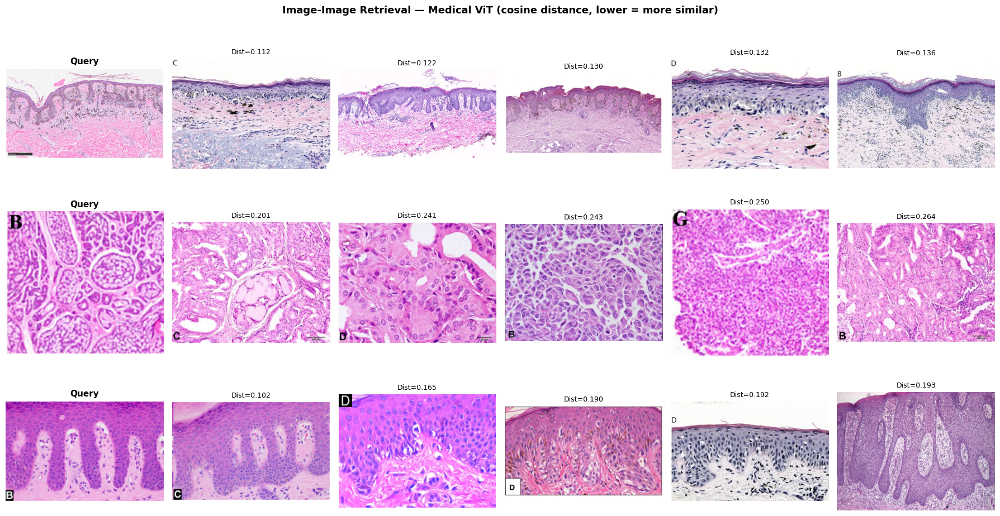

Saved images/ex3/retrieval.png


In [26]:

def reproduce_ex3(query_positions=[0, 10, 50], top_k=5):
    all_emb = np.concatenate([img_emb_med_train, img_emb_med_test], axis=0)
    n_train = len(img_emb_med_train)

    # Build embedding-index → (split, dataset_index) mapping
    refs = []
    for ii in range(len(ds_train)):
        if ds_train[ii].get('magnification', None) is not None:
            refs.append(('train', ii))
    for ii in range(len(ds_test)):
        if ds_test[ii].get('magnification', None) is not None:
            refs.append(('test', ii))

    query_emb_indices = [n_train + p for p in query_positions]

    fig, axes = plt.subplots(len(query_positions), top_k + 1, figsize=(18, 10))

    for row, q_idx in enumerate(query_emb_indices):
        query_vec = all_emb[q_idx:q_idx+1]
        sims = (all_emb @ query_vec.T).squeeze()
        sims[q_idx] = -1.0  # exclude self
        top_indices = np.argsort(sims)[::-1][:top_k]

        split_q, ds_idx_q = refs[q_idx]
        ds_q = ds_test if split_q == 'test' else ds_train
        axes[row, 0].imshow(ds_q[ds_idx_q]['image'].convert('RGB'))
        axes[row, 0].set_title('Query', fontsize=11, fontweight='bold')
        axes[row, 0].axis('off')

        for col, ret_idx in enumerate(top_indices):
            split_r, ds_idx_r = refs[ret_idx]
            ds_r = ds_test if split_r == 'test' else ds_train
            axes[row, col + 1].imshow(ds_r[ds_idx_r]['image'].convert('RGB'))
            dist = 1.0 - sims[ret_idx]
            axes[row, col + 1].set_title(f'Dist={dist:.3f}', fontsize=9)
            axes[row, col + 1].axis('off')

    plt.suptitle('Image-Image Retrieval — Medical ViT (cosine distance, lower = more similar)',
                 fontsize=13, fontweight='bold')
    plt.tight_layout()
    os.makedirs('images/ex3', exist_ok=True)
    plt.savefig('images/ex3/retrieval.png', dpi=150)
    plt.show()
    print('Saved images/ex3/retrieval.png')

reproduce_ex3()


**Exercise 3 Answer:**

For the first query image, the five retrieved images all share a dominant purple staining and a clear tissue boundary matching the query, though some cells appear more squished while others are rounder. The overall content and tissue structure match well. For the second query, the retrieved images share pink-dominant coloring and very similar cell morphology, though the magnification level drifts slightly as the cosine distance increases, with closer matches showing more consistent zoom levels. The content remains consistent across all five. For the third query, all retrieved images share the same magnification and feature characteristic bright elliptical spots (likely glandular lumens), with four out of five showing this pattern clearly, though the staining color varies between grey and pink tones. Overall, the medical ViT's embedding space primarily captures tissue structure and architecture as the strongest similarity signal, followed by magnification level and staining pattern. The model retrieves semantically meaningful matches rather than just pixel-level lookalikes, demonstrating that the learned representations encode high-level histological features.


### Exercise 4

ViTs use self-attention to model interactions between image patches. In each attention layer, tokens exchange information with one another, gradually forming a global image representation. In this assignment, we visualize patch → CLS attention, which shows how strongly each image patch contributes to the CLS token at a given layer.

A utility for extracting and visualizing attention maps is provided in `code/vit_attention_utils.py`. Run the setup cell below to access the utility.


In [ ]:
def running_in_colab():
    try:
        import google.colab
        return True
    except ImportError:
        return False

if running_in_colab():
  if not os.path.isdir('project-ai-medical-imaging'):
      !git clone https://github.com/tueimage/project-ai-medical-imaging.git
  !ls
  %cd /content/project-ai-medical-imaging/code
else:
  %cd ../code

After executing the code cell below, attention maps are displayed for 4 test images for both the medical and general ViT models. The interactive sliders allow you to navigate across transformer layers and inspect individual attention heads. Setting the head slider to -1 displays the attention averaged across all heads in the selected layer. Different test images can be visualized by modifying the indices in the `idxs` array (valid range: 0–397).

In [ ]:
from vit_attention_utils import ViTAttentionViewer
from ipywidgets import interact, IntSlider

viewer = ViTAttentionViewer(
    model_medical=model_medical,
    model_general=model_general,
    preprocess_fn=preprocess_val,
    device=device,
    mean=preprocess_val.transforms[-1].mean,
    std=preprocess_val.transforms[-1].std,
)

idxs = [0, 10, 100, 102]

num_heads = model_medical.visual.trunk.blocks[0].attn.num_heads

@interact(
    layer=IntSlider(min=0, max=11, step=1, value=0),
    head=IntSlider(min=-1, max=num_heads-1, step=1, value=-1),
)
def view(layer, head):
    head_sel = "mean" if head == -1 else head
    viewer.show_side_by_side(
        ds_test,
        idxs,
        layer=layer,
        head=head_sel,
        alpha=0.5,
    )

**Exercise 4 Answer:**

 When looking at the early layers it becomes clear that the general model focuses mainly on edges or non-tissue spaces, while the medical model has a preference for biological tissue types. When looking at the first layer this is clearly shown when scrolling through the heads. For the medical model most of the heads already attend to a specific tissue type, while for the general it stays more broad, overlapping these tissue types. This can be explained as the general model is trained on datasets where contrasts/borders are the most informative features in a picture whereas the medical model is trained on distinguishing tissue types.  The medical model develops this attention to clinically relevant regions even further, while general model develops an attention for the textual regions and borders of the tissue as can be seen with in the layers 5/6/7. It does show some weird attention in the medical model during some layers, for example layer 5, head 1 attends to a region outside of the tissue, in layer 7 this can be seen again in the first head. This could be a hint of overfitting to non-tissue features that coincidentally appeared in some of the data used to train the model. When looking at the heads of the model, it is clearly visible that during the late layers the heads in the medical model have a region/tissue type, while in the general model it seems more varied. It also appears that the during the later layers the attention in the medical model seems more focused on local details then global context, while in the general model it looks remain quite broad.  

### Logs
#### First Flipped Classroom
ℹ️ *Write the log for your group in this cell. Should be in a narrative style, aim for a max. of 600 words.*

**Role**: Consultant

**Description** of activities during flipped classroom:
As a preparation for this flipped classroom, we skimmed through the practice exercises given to us. Also, we looked at the video explaining the paper: "An imaga is worth 16x16 words". We looked at the other available videos and papers.

During the session, we answered a question the other group had about 14x14 and 16x16 cutting the image. Where they specifically had a question about which was computationally heavier. Then there was a question about the importance of the positional embedding. Because they didn't understand how you first assign something to the image, thus making it a fact, and then later on it is called a probability so this looked contradictory to them. We explained to them that the assigning is used in the training and the test set always returns possibilities.
Then another question we answered was why only the output of transformer of the patch was used.
Lastly, we discussed possible solutions to theory exercise 2.

#### Second Flipped Classroom
*Write the log for your group in this cell. Should be in a narrative style, aim for a max. of 600 words.*

**Role**: Client

**Description** of activities during flipped classroom:
As clients, we didn't have much questions during this session. However, we discussed the second exercise. We comapred the AUC scores. The other group explained to us which parameters they used and what that gave them for results. We saw differences with our approach where they had plotted the ROCs as well as the AUC score, whereas we only had the AUC scores.